# MUSIC RECOMMDATION SYSTEM

##  Importing Libraries

In [55]:
# Data imports
import pandas as pd
import numpy as np
import seaborn as sns
import os

# Visualization imports
import matplotlib.pyplot as plt
import seaborn as sns

# ML Imports
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans

##  Get the data

The first step in any machine learning workflow is to get the data and explore it.

In [56]:
# Load the dataset
songs_df =pd.read_csv('dataset/data.csv')

print(songs_df) 

# Inspect column names
print(songs_df.columns)

# numerical dataset
numerical_data = songs_df[['valence', 'year', 'acousticness',  'danceability',
       'duration_ms', 'energy', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'popularity', 
       'speechiness', 'tempo']]
numerical_data.head()

        valence  year  acousticness  ... release_date  speechiness    tempo
0        0.0594  1921       0.98200  ...         1921       0.0366   80.954
1        0.9630  1921       0.73200  ...         1921       0.4150   60.936
2        0.0394  1921       0.96100  ...         1921       0.0339  110.339
3        0.1650  1921       0.96700  ...         1921       0.0354  100.109
4        0.2530  1921       0.95700  ...         1921       0.0380  101.665
...         ...   ...           ...  ...          ...          ...      ...
170648   0.6080  2020       0.08460  ...   2020-05-29       0.0881  105.029
170649   0.7340  2020       0.20600  ...   2020-10-23       0.0605  137.936
170650   0.6370  2020       0.10100  ...   2020-11-03       0.0809   91.688
170651   0.1950  2020       0.00998  ...   2020-01-17       0.3080   75.055
170652   0.6420  2020       0.13200  ...   2020-10-16       0.1080   94.991

[170653 rows x 19 columns]
Index(['valence', 'year', 'acousticness', 'artists', 'dancea

,valence,year,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
0,0.0594,1921,0.982,0.279,831667,0.211,0.878000,10,0.665,-20.096,1,4,0.0366,80.954
1,0.9630,1921,0.732,0.819,180533,0.341,0.000000,7,0.160,-12.441,1,5,0.4150,60.936
2,0.0394,1921,0.961,0.328,500062,0.166,0.913000,3,0.101,-14.850,1,5,0.0339,110.339
3,0.1650,1921,0.967,0.275,210000,0.309,0.000028,5,0.381,-9.316,1,3,0.0354,100.109
4,0.2530,1921,0.957,0.418,166693,0.193,0.000002,3,0.229,-10.096,1,2,0.0380,101.665


##  Data Checking

In [57]:
#Check the empty values
songs_df.isnull()
songs_df.isnull().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

##  Data Handling

In [58]:
missing_value =["N/A","na",np.nan]
songs_df = pd.read_csv('dataset/data.csv', 
                 na_values=missing_value)
songs_df.isnull().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

## Show Data


In [59]:
songs_df.describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,170653.000000,170653.000000,170653.000000,170653.000000,1.706530e+05,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000
mean,0.528587,1976.787241,0.502115,0.537396,2.309483e+05,0.482389,0.084575,0.167010,5.199844,0.205839,-11.467990,0.706902,31.431794,0.098393,116.861590
std,0.263171,25.917853,0.376032,0.176138,1.261184e+05,0.267646,0.278249,0.313475,3.515094,0.174805,5.697943,0.455184,21.826615,0.162740,30.708533
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,0.415000,1.698270e+05,0.255000,0.000000,0.000000,2.000000,0.098800,-14.615000,0.000000,11.000000,0.034900,93.421000
50%,0.540000,1977.000000,0.516000,0.548000,2.074670e+05,0.471000,0.000000,0.000216,5.000000,0.136000,-10.580000,1.000000,33.000000,0.045000,114.729000
75%,0.747000,1999.000000,0.893000,0.668000,2.624000e+05,0.703000,0.000000,0.102000,8.000000,0.261000,-7.183000,1.000000,48.000000,0.075600,135.537000
max,1.000000,2020.000000,0.996000,0.988000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.970000,243.507000


## Correlation Matrix

In [60]:
songs_df_corr = numerical_data.corr()
songs_df_corr

,valence,year,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
valence,1.000000,-0.028245,-0.184101,0.558946,-0.191813,0.353876,-0.198501,0.028473,0.003832,0.313512,0.015641,0.014200,0.046381,0.171689
year,-0.028245,1.000000,-0.614250,0.188515,0.079713,0.530272,-0.272371,0.007540,-0.057318,0.487697,-0.032385,0.862442,-0.167816,0.141048
acousticness,-0.184101,-0.614250,1.000000,-0.266852,-0.076373,-0.749393,0.329819,-0.020550,-0.024482,-0.561696,0.047168,-0.573162,-0.043980,-0.207120
danceability,0.558946,0.188515,-0.266852,1.000000,-0.139937,0.221967,-0.278063,0.024439,-0.100193,0.285057,-0.045956,0.199606,0.235491,0.001801
duration_ms,-0.191813,0.079713,-0.076373,-0.139937,1.000000,0.042119,0.084770,-0.004266,0.047168,-0.003037,-0.046085,0.059597,-0.084604,-0.025472
energy,0.353876,0.530272,-0.749393,0.221967,0.042119,1.000000,-0.281101,0.027705,0.126192,0.782362,-0.039260,0.485005,-0.070555,0.250865
instrumentalness,-0.198501,-0.272371,0.329819,-0.278063,0.084770,-0.281101,1.000000,-0.014591,-0.047193,-0.408611,-0.036543,-0.296750,-0.121700,-0.105361
key,0.028473,0.007540,-0.020550,0.024439,-0.004266,0.027705,-0.014591,1.000000,0.000205,0.017385,-0.116260,0.007826,0.023784,0.002629
liveness,0.003832,-0.057318,-0.024482,-0.100193,0.047168,0.126192,-0.047193,0.000205,1.000000,0.056422,0.002641,-0.076464,0.134667,0.007714
loudness,0.313512,0.487697,-0.561696,0.285057,-0.003037,0.782362,-0.408611,0.017385,0.056422,1.000000,-0.010727,0.457051,-0.139296,0.209774


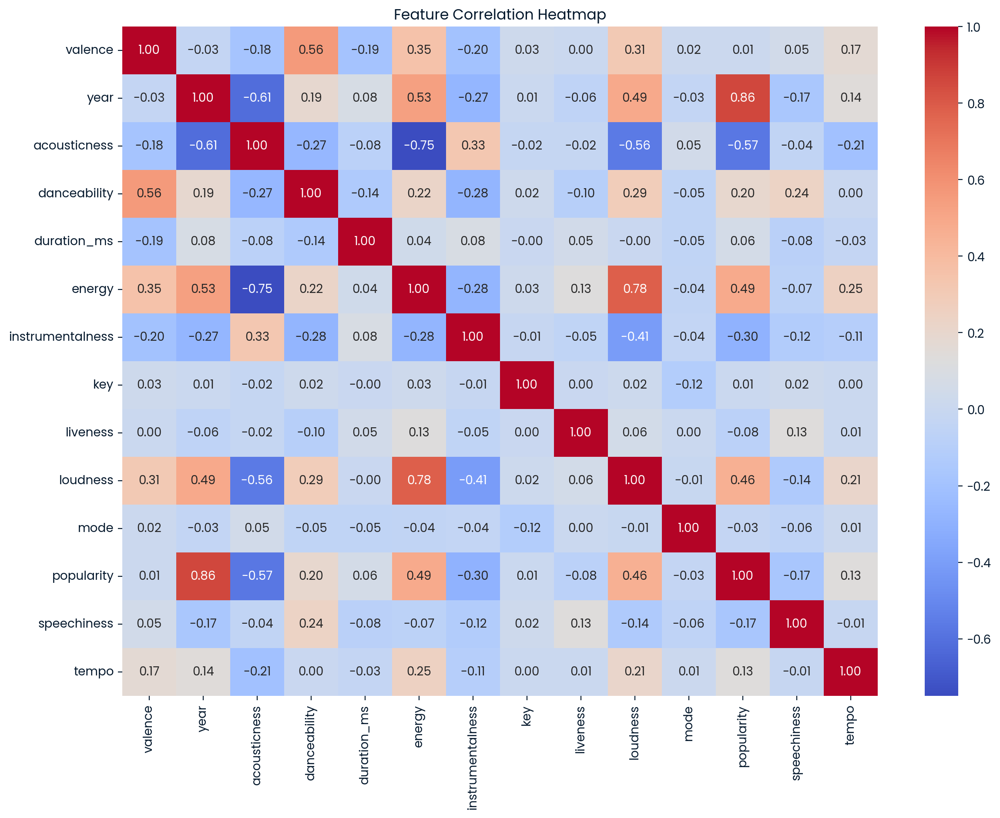

In [61]:
# Correlation heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(songs_df_corr , annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Feature Correlation Heatmap')
plt.show()

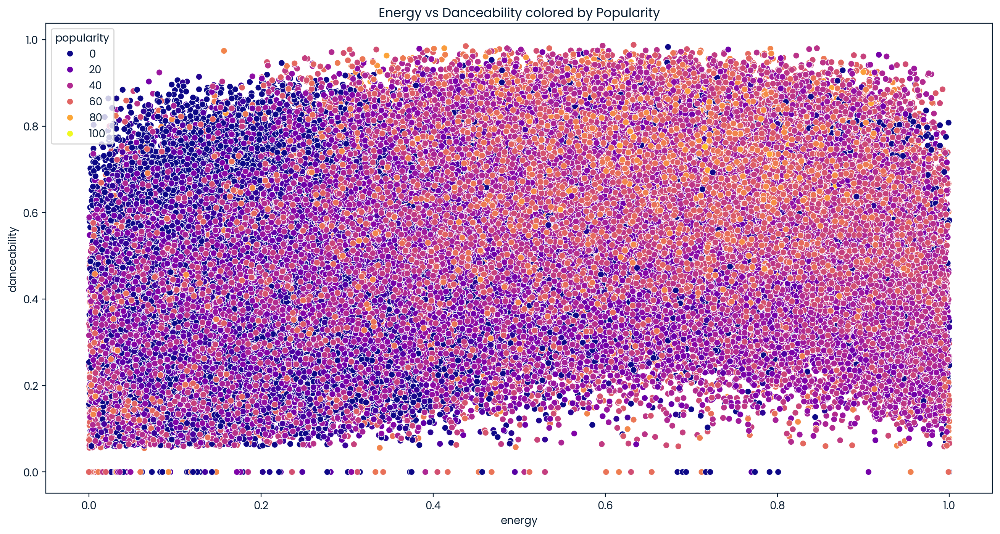

In [62]:
# Plotting energy vs. danceability, colored by popularity
plt.figure(figsize=(16, 8))
sns.scatterplot(x='energy', y='danceability', hue='popularity', data=songs_df, palette='plasma')
plt.title('Energy vs Danceability colored by Popularity')
plt.show()

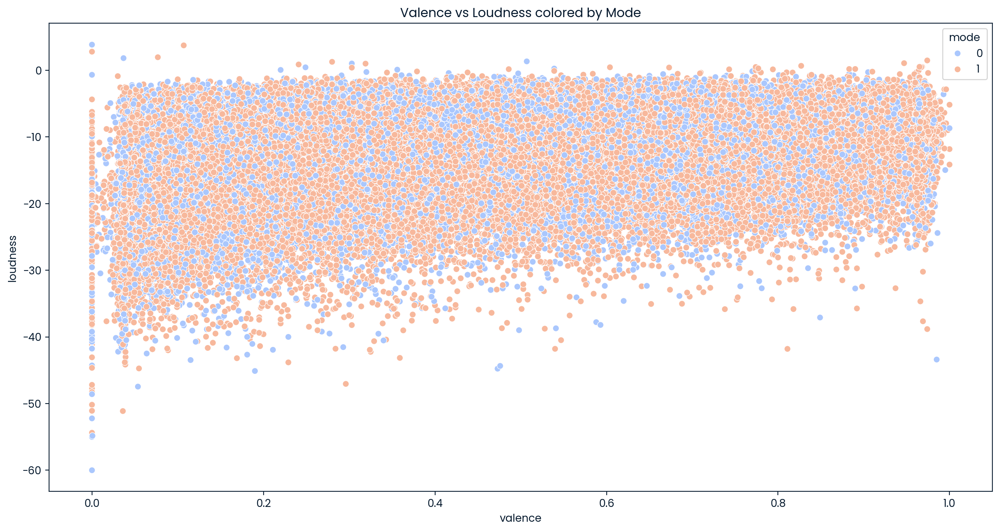

In [51]:

# Plotting valence vs. loudness, colored by mode
plt.figure(figsize=(16, 8))
sns.scatterplot(x='valence', y='loudness', hue='mode', data=songs_df, palette='coolwarm')
plt.title('Valence vs Loudness colored by Mode')
plt.show()

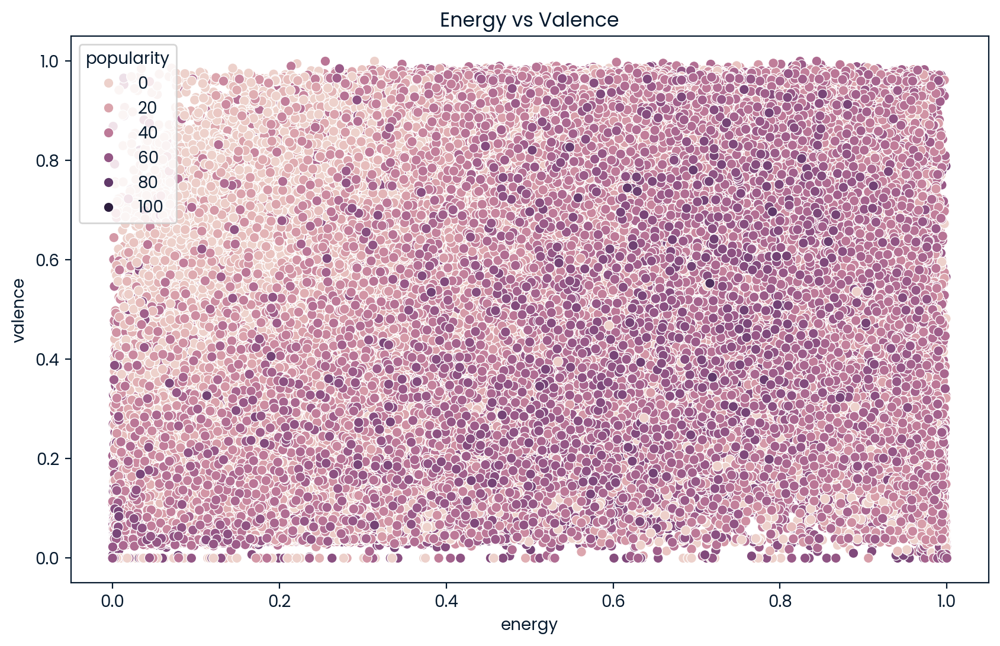

In [53]:
# Plotting energy vs. valence, colored by popularity
plt.figure(figsize=(10, 6))
sns.scatterplot(x='energy', y='valence', hue='popularity', data=songs_df)
plt.title('Energy vs Valence')
plt.show()

## Popularity by track duration

<Axes: xlabel='duration_ms', ylabel='popularity'>

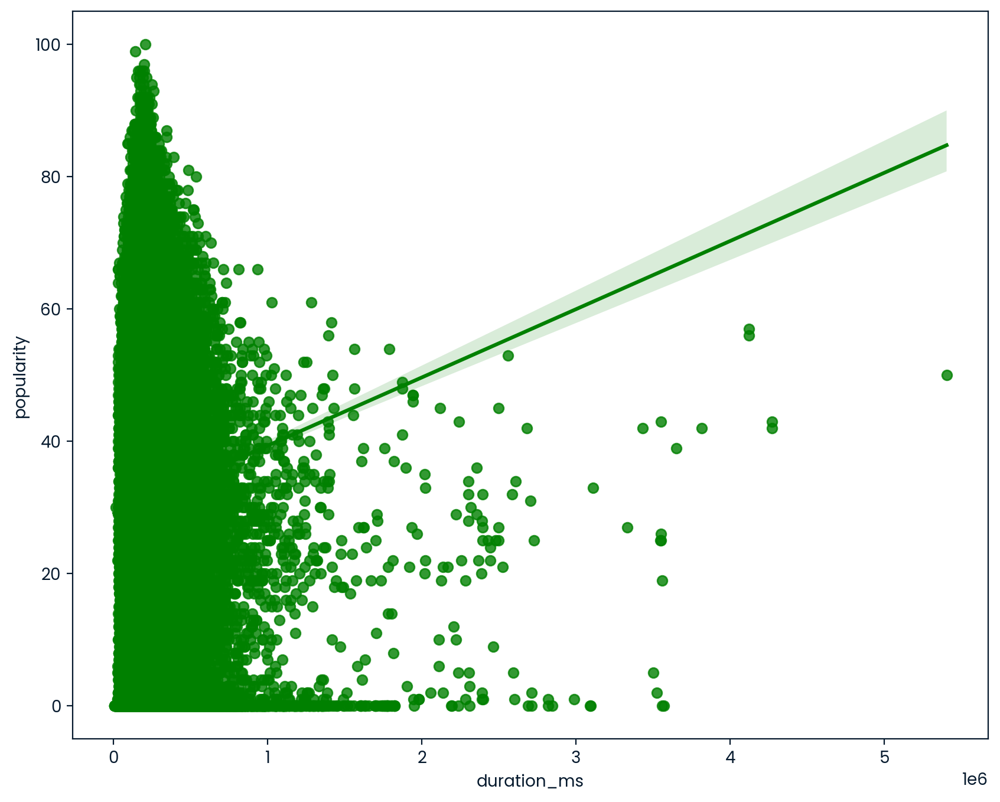

In [63]:

x = songs_df['duration_ms']
y = songs_df['popularity']
plt.figure(figsize=(10,8))
sns.regplot(x=x, y=y, color="green", truncate=True, n_boot=100)

## features selection
we will choose numerical features

In [64]:
# Selecting relevant features for recommendation
features = ['valence', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo']

# Replace missing values with 0
songs_df[features] = songs_df[features].fillna(0)

In [65]:
songs_df[features]

,valence,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo
0,0.0594,0.98200,0.279,831667,0.211,0.878000,0.6650,-20.096,0.0366,80.954
1,0.9630,0.73200,0.819,180533,0.341,0.000000,0.1600,-12.441,0.4150,60.936
2,0.0394,0.96100,0.328,500062,0.166,0.913000,0.1010,-14.850,0.0339,110.339
3,0.1650,0.96700,0.275,210000,0.309,0.000028,0.3810,-9.316,0.0354,100.109
4,0.2530,0.95700,0.418,166693,0.193,0.000002,0.2290,-10.096,0.0380,101.665
...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,0.08460,0.786,301714,0.808,0.000289,0.0822,-3.702,0.0881,105.029
170649,0.7340,0.20600,0.717,150654,0.753,0.000000,0.1010,-6.020,0.0605,137.936
170650,0.6370,0.10100,0.634,211280,0.858,0.000009,0.2580,-2.226,0.0809,91.688
170651,0.1950,0.00998,0.671,337147,0.623,0.000008,0.6430,-7.161,0.3080,75.055


## Fitting K-means to data

In [67]:

# Define the number of clusters
n_clusters = 20

# Initialize K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

# Fit K-means to the data
songs_df['cluster'] = kmeans.fit_predict(songs_df[features])

In [68]:
songs_df

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,cluster
0,0.0594,1921,0.98200,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,3
1,0.9630,1921,0.73200,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.1600,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,1
2,0.0394,1921,0.96100,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.1010,-14.850,1,Gati Bali,5,1921,0.0339,110.339,8
3,0.1650,1921,0.96700,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.3810,-9.316,1,Danny Boy,3,1921,0.0354,100.109,16
4,0.2530,1921,0.95700,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.2290,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,2020,0.08460,"['Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna...",0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029,17
170649,0.7340,2020,0.20600,['Ashnikko'],0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936,11
170650,0.6370,2020,0.10100,['MAMAMOO'],0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688,14
170651,0.1950,2020,0.00998,['Eminem'],0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055,9


## Music recommendation function


In [70]:
# Function to get recommendations based on song name
def get_kmeans_recommendations(song_name, data=songs_df, top_n=10):
    # Find the cluster of the given song
    song_cluster = data.loc[data['name'] == song_name, 'cluster'].values
    
    if len(song_cluster) == 0:
        print(f"Song '{song_name}' not found in the dataset.")
        return []
    
    song_cluster = song_cluster[0]
    
    # Get songs from the same cluster, excluding the input song
    cluster_songs = data[data['cluster'] == song_cluster]
    cluster_songs = cluster_songs[cluster_songs['name'] != song_name]
    
    # Get top N recommendations
    recommendations = cluster_songs.head(top_n)
    
    return recommendations['name'].tolist()


In [71]:
# Example usage:
song_name = "Clancy Lowered the Boom"  # Replace with any song name from your dataset
recommended_songs = get_kmeans_recommendations(song_name)
print(f"Recommendations for '{song_name}':")
print(recommended_songs)

Recommendations for 'Clancy Lowered the Boom':
['When Irish Eyes Are Smiling', 'The Wearing of the Green', 'La Mañanita - Remasterizado', 'Ud Taksimi', "Je M'donne", 'A Mi Palomita - Remasterizado', 'Amurado Me Dejaste - Remasterizado', "Je N'peux Pas Vivre Sans Amour", 'Galway Bay', 'Mis Harapos - Remasterizado']
